### Inainte de rulare, instalati modulele pymediainfo si moviepy

In [1]:
!pip install pymediainfo
!pip install moviepy

     ---------------------------------------- 2.7/2.7 MB 4.3 MB/s eta 0:00:00
     -------------------------------------- 388.3/388.3 KB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 78.4/78.4 KB ? eta 0:00:00
  Using cached requests-2.27.1-py2.py3-none-any.whl (63 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 3.4/3.4 MB 15.3 MB/s eta 0:00:00
     --------------------------------------- 22.6/22.6 MB 31.2 MB/s eta 0:00:00
  Using cached charset_normalizer-2.0.12-py3-none-any.whl (39 kB)
  Using cached certifi-2021.10.8-py2.py3-none-any.whl (149 kB)
  Using cached urllib3-1.26.9-py2.py3-none-any.whl (138 kB)
  Using cached idna-3.3-py3-none-any.whl (61 kB)
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110743 sha256=b5203eda653ae8d409ee

### Cateva resurse
Video explicativ pentru compresie: https://youtu.be/r6Rp-uo6HmI

Alt video care explica si rolul compresiei in background-urile videourilor: https://youtu.be/h9j89L8eQQk

### Capturare video de la camera si afisare pe ecran (OpenCV)

OpenCV poate seta framerate-ul pentru o captura video direct de la camera doar daca dispozitivul hardware suporta acest lucru (deoarece comunica direct cu camera). In caz contrar, modificarea framerate-ului folosind OpenCV nu va avea niciun rezultat.

Daca este necesara setarea unui framerate fix pentru fluxul de la o camera (in OpenCV), atunci este necesara folosirea unui modul intermediar (un backend care sa trimita datele catre OpenCV). Un exemplu de astfel de backend este [GStreamer](https://gstreamer.freedesktop.org/). 

In [2]:
import cv2

cap = cv2.VideoCapture(0)
print("Opened Camera")

cap.set(cv2.CAP_PROP_FPS, 60) 
fps = cap.get(cv2.CAP_PROP_FPS)
print("Frame rate is: ", fps)

while( cap.isOpened() ):

    ret,frame = cap.read()
    if not ret:
        break

    cv2.imshow('frame', frame)

    k = cv2.waitKey(1)
    if( k == ord('q') ):
        break
        
cv2.destroyAllWindows()
cap.release()

Opened Camera
Frame rate is:  30.0


### Afisarea unui fisier video folosind OpenCV

In cazul fisierelor video, putem folosi tot `cv2.VideoCapture`, caruia ii specificam numele respectivului video in loc de indexul camerei. Totusi, afisarea cadrelor nu va tine cont neaparat de FPS-ul la care a fost salvat videoul. In acest caz, viteza de redare trebuie modificata prin setarea unui timp adecvat (in milisecunde) pentru functia `cv2.waitKey`.

Daca timpul de asteptare intre redarea cadrelor este prea mic, videoul va fi redat prea rapid, iar daca timpul este prea mare, rezultatul va fi in slow motion. 

In [3]:
import numpy as np
import cv2

def show_video(name): 

    cap = cv2.VideoCapture(name)
    
    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        cv2.imshow(name, frame)
        
        # TODO: modificati parametrul waitKey pentru a reda videoul la viteza mai mare 
        # si apoi la viteza la mica
        k = cv2.waitKey(7)
        if( k == ord('q') ):
            break
    
    cap.release()
    cv2.destroyAllWindows()
    
show_video('video_mpeg_still.avi')
show_video('video_mpeg_dynamic.avi')
show_video('video_raw_still.avi')
show_video('video_raw_dynamic.avi')

### Afisarea unui video in Notebook (folosind `moviepy`)

In acest caz, moviepy va citi fisierul video, iar la redare se va tine cont de durata si framerate-ul videoului.

In [4]:
import moviepy.editor as mp

video = mp.VideoFileClip(r"video_mpeg_still.avi")
print("Video format MPEG in care cadrele nu se modifica semnificativ")
video.ipython_display()

Video format MPEG in care cadrele nu se modifica semnificativ
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [5]:
video = mp.VideoFileClip(r"video_mpeg_dynamic.avi")
print("Video format MPEG in care exista miscare")
video.ipython_display()

Video format MPEG in care exista miscare
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [6]:
video = mp.VideoFileClip(r"video_raw_still.avi")
print("Video format RAW (necomprimat) in care cadrele nu se modifica semnificativ")
video.ipython_display()

Video format RAW (necomprimat) in care cadrele nu se modifica semnificativ
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [7]:
video = mp.VideoFileClip(r"video_raw_dynamic.avi")
print("Video format RAW (necomprimat) in care exista miscare")
video.ipython_display()

Video format RAW (necomprimat) in care exista miscare
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Afisare informatii (metadate) fisiere video folosind `pymediainfo`

TODO: afisati si informatiile despre videourile `video_mpeg_dynamic.avi`, `video_raw_still.avi` si `video_raw_dynamic.avi`.

Observati duratele acestora, bit rate-ul si dimensiunile acestora. De ce apar diferentele la dimensiune?

In [11]:
from pymediainfo import MediaInfo


def show_info(filename):
    media_info = MediaInfo.parse(filename)
    print(filename)
    for track in media_info.tracks:
        if track.track_type == "Video":
            print("Bit rate: {t.bit_rate}, Frame rate: {t.frame_rate}, "
              "Format: {t.format}".format(t=track))
            print("Other formats bitrate:", track.other_bit_rate)
            print("Duration (raw value):", track.duration)
            print("Display ratio:", track.display_aspect_ratio)
            print("Frame count:", track.frame_count)
            print("Compression mode:", track.compression_mode)
            print("Streamsize:", track.stream_size)
            print("Other formats streamsize:", track.other_stream_size)
            print()
            print()
        
files = ["video_mpeg_still.avi", "video_mpeg_dynamic.avi", "video_raw_still.avi", "video_raw_dynamic.avi"]

for file in files:
    show_info(file)

video_mpeg_still.avi
Bit rate: 274525, Frame rate: 25.000, Format: MPEG-4 Visual
Other formats bitrate: ['275 kb/s']
Duration (raw value): 4160
Display ratio: 1.333
Frame count: 104
Compression mode: Lossy
Streamsize: 142753
Other formats streamsize: ['139 KiB (95%)', '139 KiB', '139 KiB', '139 KiB', '139.4 KiB', '139 KiB (95%)']


video_mpeg_dynamic.avi
Bit rate: 1942310, Frame rate: 25.000, Format: MPEG-4 Visual
Other formats bitrate: ['1 942 kb/s']
Duration (raw value): 4160
Display ratio: 1.333
Frame count: 104
Compression mode: Lossy
Streamsize: 1010001
Other formats streamsize: ['986 KiB (99%)', '986 KiB', '986 KiB', '986 KiB', '986.3 KiB', '986 KiB (99%)']


video_raw_still.avi
Bit rate: 245760000, Frame rate: 25.000, Format: RGBA
Other formats bitrate: ['246 Mb/s']
Duration (raw value): 4160
Display ratio: 1.333
Frame count: 104
Compression mode: None
Streamsize: 127795200
Other formats streamsize: ['122 MiB (100%)', '122 MiB', '122 MiB', '122 MiB', '121.9 MiB', '122 MiB (100%)

### Salvarea unui fisier video cu cadre de la camera folosind un codec video

Cele 4 videouri de mai sus au fost generate folosind `cv2.VideoWriter`, functie careia trebuie sa i se specifice tipul de codec (format de comprimare) pe care sa il foloseasca la scriere, precum si framerate-ul si dimensiunea cadrelor.

Tipul de codec este specificat prin functia `cv2.VideoWriter_fourcc` si poate fi unul din lista de [aici](https://www.fourcc.org/codecs/). Cititi mai multe despre FOURCC [aici](https://www.fourcc.org/what-is-a-fourcc/).

Atentie: In acelasi format de fisier (de ex. AVI sau MP4) se pot folosi mai multe tipuri de codecuri.


In [13]:
import numpy as np
import cv2
import time

COMPRESSED_FORMAT = True

cap = cv2.VideoCapture(0)
print("Opened Camera")

if( COMPRESSED_FORMAT == True ):
    # Folosim codec MPEG4 
    fourcc = cv2.VideoWriter_fourcc(*'3IVD')#FFmpeg DivX (MS MPEG-4 v3)
else: 
    # Nu folosim comprimare, video-ul va fi salvat frame cu frame.
    fourcc = cv2.VideoWriter_fourcc(*'RGBA')

fps = 25.0
duration = 4 # seconds
dimensions = (640,  480)

out = cv2.VideoWriter('output.avi', fourcc, fps, dimensions)
if(cap.isOpened()):
    t = time.time()
    while( (time.time() - t) < duration ):
        ret, frame = cap.read()
        if not ret:
            break
        
        out.write(frame)

cap.release()
out.release()
print("Video Saved")

Opened Camera
Video Saved


### Durata unui video
Stabilirea duratei unui video creat ca in exemplul anterior se poate face in mai multe moduri.

Una dintre modalitati poate fi folosita atunci cand nu avem o specificatie fixa pentru durata. In acest caz, vom lua timpul la care am inceput preluarea de cadre de la camera, vom scrie cadrul in fisier, iar la fiecare pas vom verifica daca timpul curent a depasit timpul la care am inceput. Dupa cum am mentionat, nu avem control exact asupra duratei.

O alta modalitate este sa determinam numarul de cadre pe care ar trebui sa il contina videoul pe baza duratei dorite si a framerate-ului, si sa contorizam cate cadre am scris in fisier dupa fiecare pas, oprindu-ne la numarul necesar.

##### TODO: pe baza codului de mai sus, salvati un video cu o durata fixa de 4 secunde, pe baza numarului de cadre.

In [2]:
import numpy as np
import cv2
import time

COMPRESSED_FORMAT = True

cap = cv2.VideoCapture(0)
print("Opened Camera")

if( COMPRESSED_FORMAT == True ):
    # Folosim codec MPEG4 
    fourcc = cv2.VideoWriter_fourcc(*'3IVD')#FFmpeg DivX (MS MPEG-4 v3)
else: 
    # Nu folosim comprimare, video-ul va fi salvat frame cu frame.
    fourcc = cv2.VideoWriter_fourcc(*'RGBA')

fps = 25.0
duration = 4 # seconds
dimensions = (640,  480)

frameLimit = duration * fps

out = cv2.VideoWriter('output.avi', fourcc, fps, dimensions)
if(cap.isOpened()):
    counter = 0
    while( counter < frameLimit ):
        ret, frame = cap.read()
        if not ret:
            break
        
        out.write(frame)
        counter = counter + 1

cap.release()
out.release()
print("Video Saved")

Opened Camera
Video Saved


### Fisiere video cu sunet
Afisare informatii despre codarea video, cat si despre sunetul acestuia din containerul fisierului video.

In [1]:
from pymediainfo import MediaInfo
from pprint import pprint # pretty print
import moviepy.editor as mp

media_info = MediaInfo.parse("first_yt_video.mp4")

for track in media_info.tracks:
    if track.track_type == "Video":
        print("Video data:")
        print( "\tBit rate: {t.bit_rate}, Frame rate: {t.frame_rate}, " "Format: {t.format}".format(t=track) )
        print("\tDuration (raw value):", track.duration)
        print("\tDuration (other values):")
        print("\t", end="")
        pprint(track.other_duration, indent=10)
        
    elif track.track_type == "Audio":
        print("Audio Track data:")
        print("\t", end="")
        pprint(track.to_data(), indent=10)
        
video_clip = mp.VideoFileClip("first_yt_video.mp4")
video_clip.ipython_display()

Video data:
	Bit rate: 259228, Frame rate: 15.000, Format: AVC
	Duration (raw value): 18933
	Duration (other values):
	[         '18 s 933 ms',
          '18 s 933 ms',
          '18 s 933 ms',
          '00:00:18.933',
          '00:00:18:14',
          '00:00:18.933 (00:00:18:14)']
Audio Track data:
	{         'bit_rate': 72000,
          'bit_rate_mode': 'VBR',
          'channel_layout': 'C',
          'channel_positions': 'Front: C',
          'channel_s': 1,
          'codec_id': 'mp4a-40-2',
          'commercial_name': 'AAC',
          'compression_mode': 'Lossy',
          'count': '280',
          'count_of_stream_of_this_kind': '1',
          'duration': 18993,
          'encoded_date': 'UTC 2018-04-23 16:57:41',
          'format': 'AAC',
          'format_additionalfeatures': 'LC',
          'format_info': 'Advanced Audio Codec Low Complexity',
          'frame_count': '818',
          'frame_rate': '43.066',
          'kind_of_stream': 'Audio',
          'maximum_bit_rate

MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Separare sunet din video, suprapunere sunet peste video

In functia `write_videofile` trebuie specificat si framerate-ul videoului. Deoarece asupra cadrelor nu aducem nicio modificare, putem pastra acelasi framerate al videoului initial, care poate fi extras din metadatele din container. 

Totusi, framerate-ul noului fisier video poate fi si diferit de cel al videoului original. 


In [2]:
import moviepy.editor as mp
from pymediainfo import MediaInfo

video_file_name = "first_yt_video.mp4"

# Citire container video, selectare metadate 
media_info = MediaInfo.parse(video_file_name)
for track in media_info.tracks:
    if track.track_type == "Video":
        duration = track.duration
        fps = int(float(track.frame_rate))

# Taiem un fisier audio pentru a avea fix durata video-ului
audioclip = mp.AudioFileClip("eminem-30s.wav").subclip(0, duration/1000)

video_clip = mp.VideoFileClip(video_file_name)

video_clip.audio.write_audiofile(r"original_video_sound.mp3")

video_clip = video_clip.set_audio(audioclip)
video_clip.write_videofile("edited.mp4",fps=fps)
video_clip.ipython_display()

MoviePy - Writing audio in original_video_sound.mp3


MoviePy - Done.
Moviepy - Building video edited.mp4.
MoviePy - Writing audio in editedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video edited.mp4



Moviepy - Done !
Moviepy - video ready edited.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


##### TODO: salvati video-ul `edited.mp4` cu un framerate mai mic si apoi cu un framerate mai mare decat cel al videoului initial

Daca in primul caz (framerate mai mic) se arunca cadre, in cel de-al doilea caz (framerate mai mare decat originalul), ce se intampla? Verificati framerate-ul si in metadatele fisierului `edited.mp4`.

In [8]:
import moviepy.editor as mp
from pymediainfo import MediaInfo

video_file_name = "first_yt_video.mp4"

video_clip = mp.VideoFileClip(video_file_name)

video_clip = video_clip.set_fps(30)

video_clip.write_videofile("edited.mp4")
video_clip.ipython_display()

Moviepy - Building video edited.mp4.
MoviePy - Writing audio in editedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video edited.mp4



Moviepy - Done !
Moviepy - video ready edited.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Crearea unui video din graficul unei functii 2D folosind moviepy

Moviepy - Building video grafic_2d.mp4.
Moviepy - Writing video grafic_2d.mp4



Moviepy - Done !
Moviepy - video ready grafic_2d.mp4
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


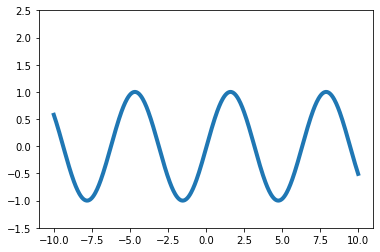

In [14]:
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

from moviepy.editor import VideoClip
from moviepy.video.io.bindings import mplfig_to_npimage

FPS = 30
DURATION = 5
NB_POINTS_GRAPH = 500
# Array interval pe care vom aplica functia
x = np.linspace(-10, 10, NB_POINTS_GRAPH)

# Creare subplot
fig, ax = plt.subplots()
 
# Functie care returneaza o imagine cu graficul functiei la un moment de timp
def make_frame(t):
    # Curatare axe
    ax.clear()
      
    # Plotare grafic
    ax.plot(x, np.sin(x + 2 * np.pi/DURATION * t), lw = 4)
    ax.set_ylim(-1.5, 2.5)
    
    # Returnare imagine din grafic 
    return mplfig_to_npimage(fig)
 
# Creare clip video
clip = VideoClip(make_frame, duration = DURATION)
clip.write_videofile("grafic_2d.mp4", fps = FPS)

clip.ipython_display(fps = FPS, loop = True, autoplay = True)

##### TODO1:  Modificati numarul de puncte generate in intervalul x (NB_POINTS_GRAPH) si generati un nou video
##### TODO2: Comentati linia  `ax.clear()` din functia `make_frame(t)` si generati un nou video

### Crearea unui video din graficul unei functii 3D folosind moviepy

Paleta de culori pentru functia generata este setata prin `cm.turbo`, unde `turbo` este un gradient predefinit pentru Matplotlib. 

O lista cu paletele de culori care pot fi folosite in Matplotlib gasiti [aici](https://matplotlib.org/3.5.0/tutorials/colors/colormaps.html).

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

from moviepy.editor import VideoClip
from moviepy.video.io.bindings import mplfig_to_npimage

FPS = 30
DURATION = 10
NB_POINTS_GRAPH = 33

# Creare subplot
fig, ax = plt.subplots()
ax = fig.add_subplot( 111, projection='3d' )


xvec = np.linspace( -8.0, 8.0, NB_POINTS_GRAPH )
yvec = np.linspace( -8.0, 8.0, NB_POINTS_GRAPH ) 

# Functie care returneaza o imagine cu graficul unei functii de tip mexican hat
def make_frame(t):
    # Curatare axe
    ax.clear()
    # Setare limita fixa pe axa Z
    ax.set_zlim(0, 10)
    
    xmat, ymat = np.meshgrid( xvec, yvec )
    rmat = np.sqrt( xmat**2*t  + ymat**2 * t + np.finfo(float).eps )
    zmat = np.sin( rmat ) / rmat * 5
    # Plotare suprafata
    ax.plot_surface( xmat, ymat, zmat, cmap = cm.turbo, edgecolor = 'none' )
 
    # Returnare imagine din grafic 
    return mplfig_to_npimage(fig)
 
# Creare clip video
clip = VideoClip(make_frame, duration = DURATION)
clip.write_videofile("mexican_hat.mp4", fps=FPS)

clip .ipython_display(fps = FPS, loop = True, autoplay = True,  width=600, height=400)

##### TODO1: Schimbati paleta de culori pentru grafic cu o paleta la alegere
##### TODO2: Modificati graficul pe axa Z, astfel incat acesta sa creasca pe aceasta axa de la inceputul spre finalul videoului (in functia `make_frame`)